In [1]:
%load_ext autoreload
%autoreload 2
#%matplotlib inline

In [2]:
import numpy as np
import pylab as plt
import glob
import os

import scipy.signal as sig
from pprint import pprint

In [3]:
import icewave.display.graphes as graphes
import icewave.tools.maths as maths
import icewave.tools.rw_data as rw

import icewave.tools.datafolders as df

Linux
adour


In [4]:
date = '2024_0211'
year,day = date.split('_')

base = df.find_path('Elements',year=year)
print(base)
folder = base+day+'/Drones/'

savefolder = folder+'/Results/'

if not os.path.exists(savefolder):
    os.makedirs(savefolder)
    
filelist = glob.glob(folder+'*.h5')

savefolder
print(filelist)
filename = filelist[1]
print(filename)

/media/turbots/Elements/Share_hublot/Data/
['/media/turbots/Elements/Share_hublot/Data/0211/Drones/interpolated_u_over_buoys_traj_0211_2024.h5', '/media/turbots/Elements/Share_hublot/Data/0211/Drones/real_field_stereo_0211_2024_rectangular_grid.h5']
/media/turbots/Elements/Share_hublot/Data/0211/Drones/real_field_stereo_0211_2024_rectangular_grid.h5


In [5]:
data = rw.read_h5(filename)

In [6]:
data.keys()

<KeysViewHDF5 ['SCALE', 'X', 'Y', 'extents', 'param', 'projected_drone', 'ref_drone', 'synchro', 't', 'u', 'u_shape', 'units']>

In [7]:
for key in ['X','Y','t','u']:
    print(key,data[key].shape)

X (93, 132)
Y (93, 132)
t (3475,)
u (3, 93, 132, 3475)


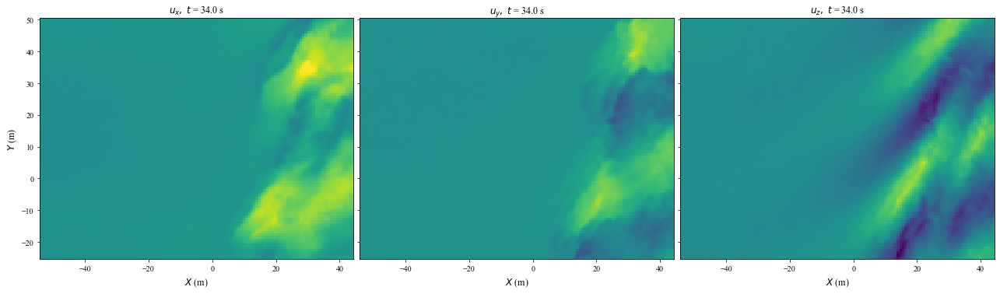

In [36]:
fig,axs = plt.subplots(figsize=(22,5.7),ncols=3,sharey=True)

ax = axs[0]
X = data['X']
Y = data['Y']
t = data['t']
i=500
t0 = np.round(t[i],decimals=1)

coords = ['x','y','z']

for j,(ax,c) in enumerate(zip(axs,coords)):
    sc = ax.pcolormesh(X,Y,data['u'][j,:,:,i],vmin=-1,vmax=1)
    plt.axis('equal')
    if j==0:
        ylabel='$Y$ (m)'
    else:
        ylabel = ''
    figs = graphes.legende('$X$ (m)',ylabel,f'$u_{c},~t$ = {t0} s',ax=ax)
    
plt.subplots_adjust(wspace=0.02)
#graphes.save_figs(figs,savedir=savefolder+'/exemples/',prefix=f'frame_{i}',frmt='png',overwrite=True)

In [38]:
data['u'].shape

(3, 93, 132, 3475)

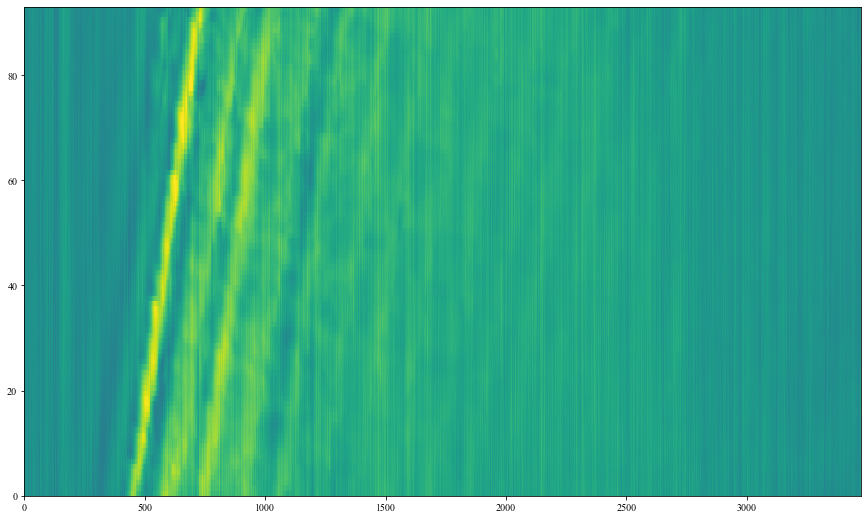

In [20]:
def compute_derivatives(data,fc=0.1/33):
    uz =  data['u'][2,...]
    [ny,nx,nt] = uz.shape
    t = data['t']
    dt = np.diff(t)[0]

    [Xdy,Xdx] = np.gradient(data['X'])
    [Ydy,Ydx] = np.gradient(data['Y'])
    dx = Xdx[0,0]
    dy = Ydy[0,0]

    u_high = np.zeros((ny,nx,nt))
    for i in range(ny):
        for j in range(nx):
            y = uz[i,j,:]
            [b,a] = sig.butter(4,fc,'high')
            u_high[i,j,:] =  sig.filtfilt(b,a,y)
    
    h = np.cumsum(u_high,axis=2)*dt
    
    dyh,dxh = np.gradient(h,axis=(0,1))
    dxyh,dxxh = np.gradient(dxh,axis=(0,1))
    dyyh,dyxh = np.gradient(dyh,axis=(0,1))
    
    m={}
    m['dxh']=dxh/dx
    m['dyh']=dyh/dy
    m['dxxh']=dxxh/dx/dx
    m['dxyh']=dxyh/dx/dy
    m['dyxh']=dyxh/dy/dx
    m['dyyh']=dyyh/dy/dy
    kappa = m['dxxh']+m['dyyh']#+dxyh+dyxh
    gauss = m['dxxh']*m['dyyh']-m['dxyh']*m['dyxh']

    m['gauss']=gauss
    m['kappa']=kappa

    return m

In [21]:
m = compute_derivatives(data)

In [22]:
m.keys()

dict_keys(['dxh', 'dyh', 'dxxh', 'dxyh', 'dyxh', 'dyyh', 'gauss', 'kappa'])

In [90]:
[ny,nx,nt]=data['u'][0,...].shape
coords = ['x','y','z']
for c in coords:
    m['p'+c]=np.zeros((ny,nx)).astype(list)
    m['m'+c]=np.zeros((ny,nx)).astype(list)

for i in range(ny):
    print(i)
    for j in range(nx):
        for k,c in enumerate(coords):
            m['p'+c][i,j]=[]
            m['p'+c][i,j] = sig.find_peaks(data['u'][k,i,j,:],distance=30,prominence=0.4,width=5)[0]        
            m['m'+c][i,j] = sig.find_peaks(-data['u'][k,i,j,:],distance=30,prominence=0.4,width=5)[0]        

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92


6
20
40
60
80
100
120


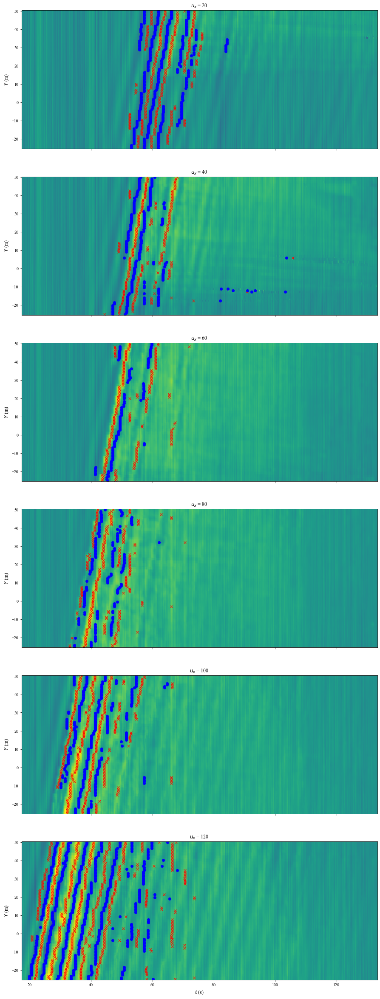

In [92]:
indices = range(20,140,20)
N = len(indices)

print(N)
fig,axs = plt.subplots(figsize=(15,7*N),nrows=N,sharex=True)

for (j0,ax) in zip(indices,axs):
    print(j0)
    y = data['Y'][:,0]
    t = data['t']
    T,Y = np.meshgrid(t,y)
    sc = ax.pcolormesh(T,Y,data['u'][0,:,j0,:],vmin=-0.8,vmax=0.8)
    for i in range(ny):
        peaks = m['px'][i,j0]
        n = len(peaks)
        ax.plot(t[peaks],y[i]*np.ones(n),'rx')

        peaks = m['mx'][i,j0]
        n = len(peaks)    
        ax.plot(t[peaks],y[i]*np.ones(n),'bo')

    figs = graphes.legende('','$Y$ (m)',r'$u_x$ = '+str(j0),cplot=True,ax=ax)

figs = graphes.legende('$t$ (s)','$Y$ (m)',r'$u_x$ = '+str(j0),cplot=True,ax=ax)


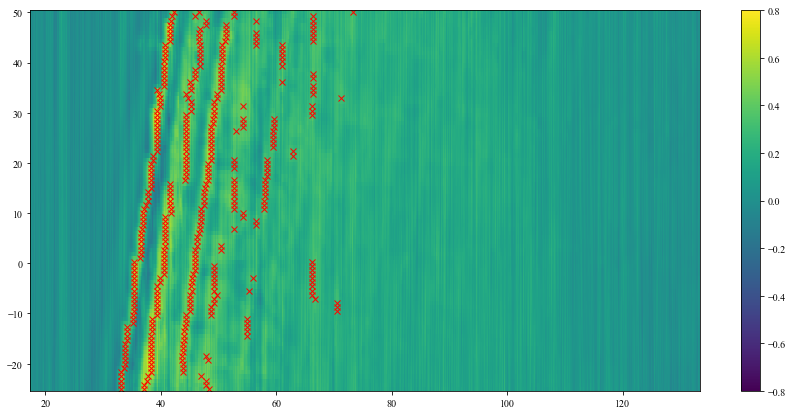

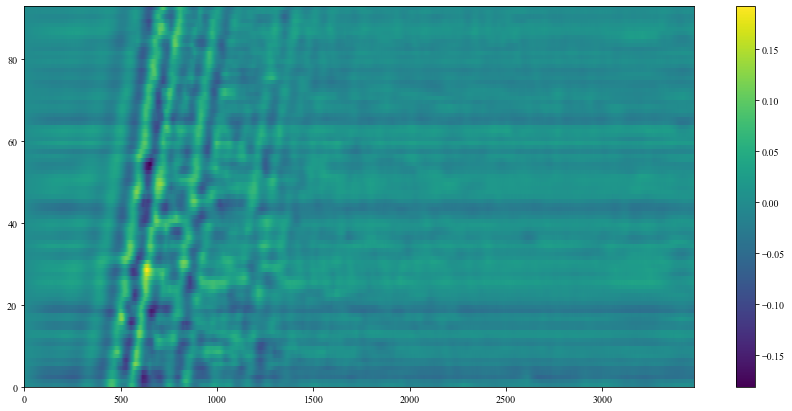

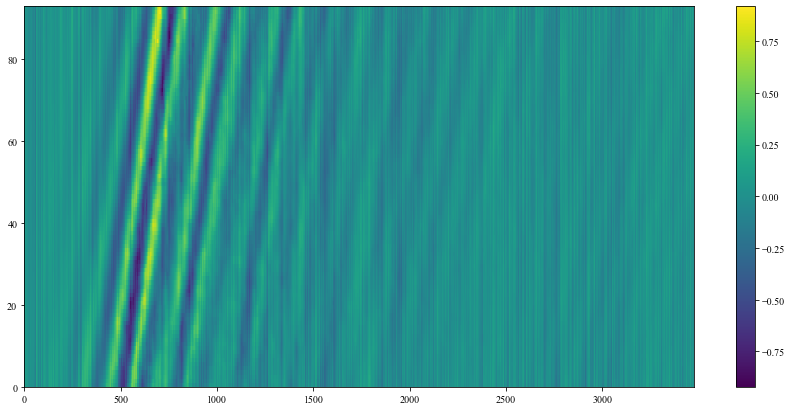

In [83]:
j0 = 85

y = data['Y'][:,0]
t = data['t']
T,Y = np.meshgrid(t,y)
fig,ax = plt.subplots(figsize=(15,7))#,ncols=3,sharey=True)
sc = ax.pcolormesh(T,Y,data['u'][0,:,j0,:],vmin=-0.8,vmax=0.8)
for i in range(ny):
    peaks = m['px'][i,j0]
    n = len(peaks)
    ax.plot(t[peaks],y[i]*np.ones(n),'rx')
    
plt.colorbar(sc)
fig,ax = plt.subplots(figsize=(15,7))#,ncols=3,sharey=True)
sc = ax.pcolormesh(m['dxh'][:,j0,:])#,vmin=-0.8,vmax=0.8)
plt.colorbar(sc)

fig,ax = plt.subplots(figsize=(15,7))#,ncols=3,sharey=True)
sc = ax.pcolormesh(data['u'][2,:,j0,:])#,vmin=-0.8,vmax=0.8)
plt.colorbar(sc)

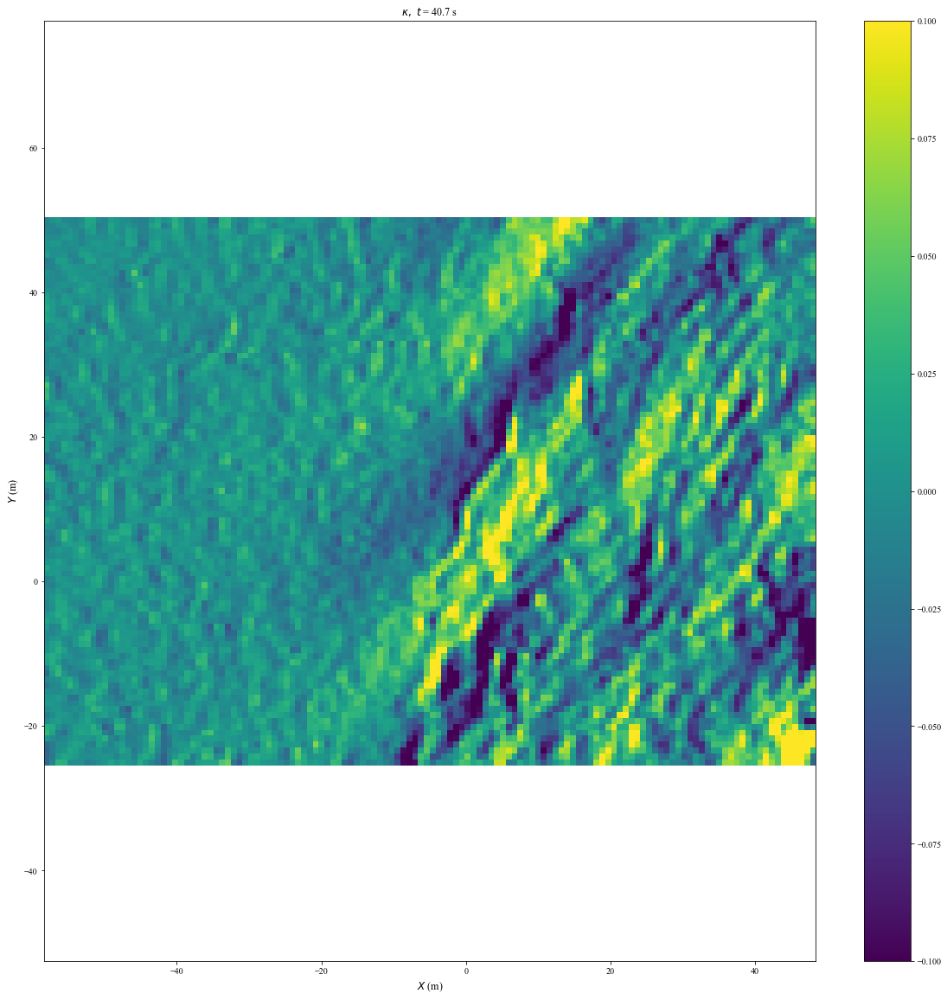

In [30]:
fig,ax = plt.subplots(figsize=(20,20))

X = data['X']
Y = data['Y']
t = data['t']
i=700
t0 = np.round(t[i],decimals=1)
sc = ax.pcolormesh(X,Y,m['dxh'][:,:,i],vmin=-0.1,vmax=0.1)
plt.colorbar(sc)
plt.axis('equal')
figs = graphes.legende('$X$ (m)','$Y$ (m)',r'$\kappa,~t$ = '+str(t0)+' s',cplot=True)
graphes.save_figs(figs,savedir=savefolder+'/images/',prefix=f'movie_{i}',frmt='png')

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920


KeyboardInterrupt: 

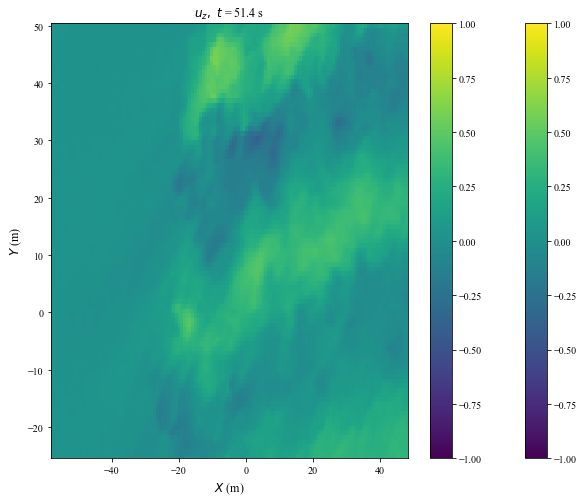

In [60]:
fig,ax = plt.subplots(figsize=(10,8))

X = data['X']
Y = data['Y']
t = data['t']

coords = ['x','y','z']
for j,c in enumerate(coords):
    for i in range(0,1500,10):
        print(i)
        t0 = np.round(t[i],decimals=1)
        sc = ax.pcolormesh(X,Y,data['u'][j,:,:,i],vmin=-1,vmax=1)
        if i==0:
            plt.colorbar(sc)
        
        figs = graphes.legende('$X$ (m)','$Y$ (m)',f'$u_z,~t$ = {t0} s')
        graphes.save_figs(figs,savedir=savefolder+f'/movie_u{c}/',prefix=f'movie_{i}',frmt='png')

In [72]:
[Udy,Udx,Acc] = np.gradient(data['u'],axis=(1,2,3))


#gradient along x,y and t for all components

In [73]:

[Xdy,Xdx] = np.gradient(X)
[Ydy,Ydx] = np.gradient(Y)
dx = Xdx[0,0]
dy = Ydy[0,0]
dt = np.diff(t)[0]

Udx = Udx/dx
Udy = Udy/dy
Acc = Acc/dt

In [71]:
print(Udx.shape)

(3, 93, 132, 3475)


In [68]:
Xdx

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

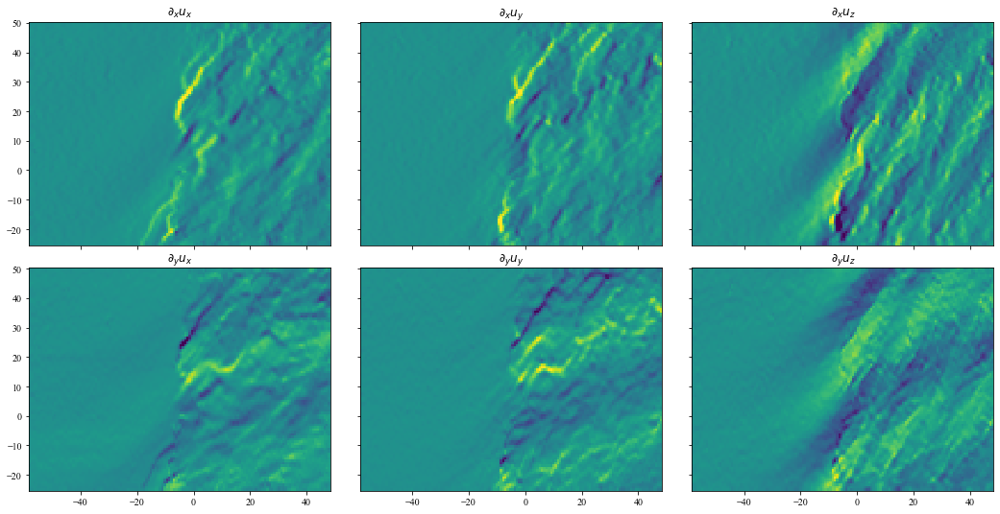

In [93]:
m=3
n=2
fig,axs = plt.subplots(figsize=(6*m,4.5*n),ncols=m,nrows=n,sharex=True,sharey=True)

X = data['X']
Y = data['Y']
i=800

vmax = 0.2
b = 5
sc = axs[0,0].pcolormesh(X,Y,Udx[0,...,i],vmin=-vmaxskimage.feature.peak_local_max(image, min_distance=1,,vmax=vmax)
sc = axs[0,1].pcolormesh(X,Y,Udx[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[0,2].pcolormesh(X,Y,Udx[2,...,i],vmin=-vmax,vmax=vmax)

sc = axs[1,0].pcolormesh(X,Y,Udy[0,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,1].pcolormesh(X,Y,Udy[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,2].pcolormesh(X,Y,Udy[2,...,i],vmin=-vmax,vmax=vmax)

#plt.colorbar(sc)

for i,c2 in enumerate(coords[:-1]):
    for j,c1 in enumerate(coords):
        title = f'$\partial_{c2} u_{c1}$'
        graphes.legende('','',title,ax=axs[i,j])
        
#graphes.legende('$X$ (m)','$Y$ (m)','title',axs=axs[i,j])

plt.subplots_adjust(hspace=0.1,wspace=0.1)

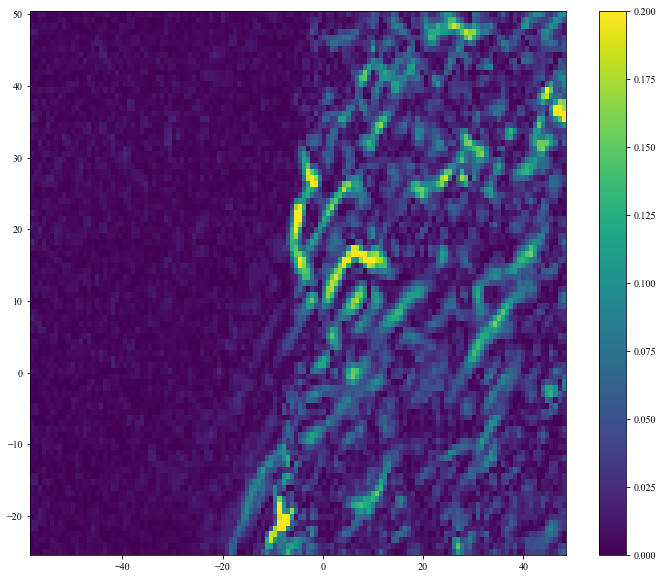

In [99]:
m=3
n=2
fig,ax = plt.subplots(figsize=(12,10))#,ncols=m,nrows=n,sharex=True,sharey=True)

i=800
vmax = 0.2
b = 5

divu = Udx[0,...]+Udy[1,...]

sc = ax.pcolormesh(X,Y,np.abs(divu)[...,i],vmin=0,vmax=vmax)
plt.colorbar(sc)
#graphes.legende('$X$ (m)','$Y$ (m)','title',axs=axs[i,j])



In [100]:
divu.shape

(93, 132, 3475)

In [110]:
x = X[0,:]

[Xt,Tx] = np.meshgrid(t,x)

In [111]:
print(Xt.shape)

(132, 3475)


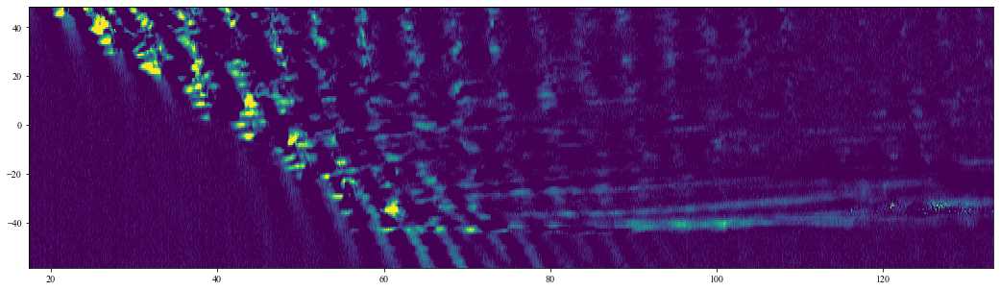

In [136]:
fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,divu[50,...],vmin=0,vmax=0.15)

In [182]:
fractures = divu>0.1
np.sum(fractures,axis=(0,1,2))

385875

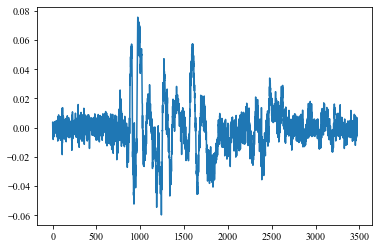

In [152]:
plt.plot(divu[50,60,:])

In [126]:
x = X[0,:]
y = Y[:,0]
X3d,Y3d,T3d = np.meshgrid(x,y,t)

print(X3d.shape)

(93, 132, 3475)


In [143]:
t = data['t']

In [176]:
fractures.shape

(93, 132, 3475)

In [183]:
i = 40
for j in range(90):
    print(j,np.sum(fractures[i,j,:]))

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
8 0
9 0
10 0
11 0
12 0
13 0
14 0
15 0
16 0
17 0
18 0
19 0
20 0
21 0
22 0
23 0
24 1
25 0
26 0
27 1
28 9
29 20
30 41
31 36
32 17
33 28
34 56
35 89
36 106
37 33
38 10
39 6
40 0
41 0
42 0
43 0
44 0
45 2
46 0
47 1
48 2
49 0
50 1
51 0
52 0
53 0
54 22
55 32
56 42
57 45
58 48
59 32
60 0
61 0
62 0
63 0
64 12
65 28
66 45
67 33
68 17
69 3
70 20
71 33
72 30
73 16
74 16
75 33
76 35
77 29
78 0
79 28
80 38
81 26
82 1
83 0
84 0
85 7
86 25
87 32
88 33
89 35


In [207]:
import numpy as np
import scipy.ndimage as ndimage

# Get local maximum values of desired neighborhood
# I'll be looking in a 5x5x5 area
img2 = ndimage.maximum_filter(divu, size=(5, 5, 5))

# Threshold the image to find locations of interest
# I'm assuming 6 standard deviations above the mean for the threshold
img_thresh = img2.mean() + img2.std() * 3

# Since we're looking for maxima find areas greater than img_thresh
labels, num_labels = ndimage.label(img2 > img_thresh)

print(num_labels)
# Get the positions of the maxima
coords = ndimage.measurements.center_of_mass(divu, labels=labels, index=np.arange(1, num_labels + 1))


650


<ipython-input-207-185f54f4cb5f>:17: DeprecationWarning: Please use `center_of_mass` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  coords = ndimage.measurements.center_of_mass(divu, labels=labels, index=np.arange(1, num_labels + 1))


In [538]:
dt = np.diff(t)[0]

In [233]:
[ny,nx] = X.shape
print(nx,ny)

132 93


In [742]:
uz =  data['u'][2,...]
fc = 0.1/33
print(fc)
nt = len(data['t'])
u_high = np.zeros((ny,nx,nt))
for i in range(ny):
    for j in range(nx):
        y = uz[i,j,:]
        [b,a] = sig.butter(4,fc,'high')
        u_high[i,j,:] =  sig.filtfilt(b,a,y)

h = np.cumsum(u_high,axis=2)*dt

dyh,dxh = np.gradient(h,axis=(0,1))
dxyh,dxxh = np.gradient(dxh,axis=(0,1))
dyyh,dyxh = np.gradient(dyh,axis=(0,1))

kappa = dxxh+dyyh#+dxyh+dyxh
kappa_abs = np.abs(dxxh)+np.abs(dyyh)
gauss = dxxh*dyyh-dxyh*dyxh

0.0030303030303030303


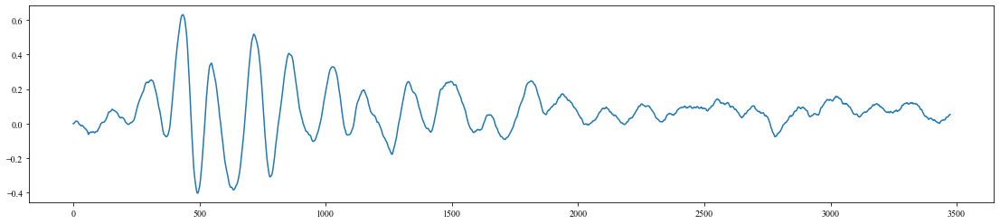

In [743]:
fig,ax = plt.subplots(figsize=(4.78*4,4))

i = 45
j = 100
ax.plot(h[i,j,:])
#ax.plot(h[i,j,:])

In [455]:
Mat = np.asarray([[dxxh,dxyh],[dyxh,dyyh]])
print(Mat.shape)

(2, 2, 93, 132, 3475)


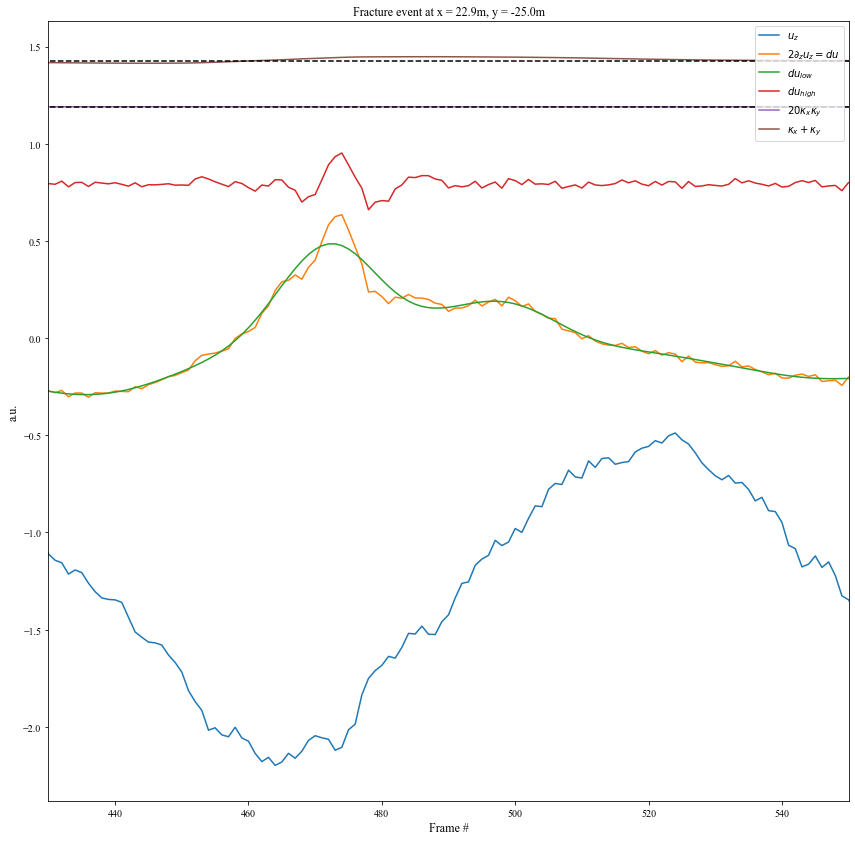

In [746]:
def display_exemple(i,j,tmin,tmax):
    fig,ax = plt.subplots(figsize=(4.78*3,4.78*3))

    ax.plot(data['u'][2,i,j,:]-1.2)
    ax.plot(Udx[2,i,j,:]*2)
    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,0.1,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low

    nt = len(y)
        
    shift = np.max(y)*2.5
    shift2 = shift*1.5
    ax.plot(y_low*2)
    y_high = y-y_low
    ax.plot(y_high*2+shift)
    ax.plot(gauss[i,j,:]/5+shift2)

    ax.plot(kappa[i,j,:]/5+shift2*1.2)


    plt.legend(['$u_z$','$2\partial_z u_z = du$','$du_{low}$','$du_{high}$',r'$20 \kappa_x \kappa_y$','$\kappa_x + \kappa_y$'],fontsize=10,loc=1)
    
    #ax.plot(data['u'][2,i,j,:])
    ax.set_xlim([tmin,tmax])
    
    x0 = np.round(data['X'][0,j],decimals=1)
    y0 = np.round(data['Y'][0,j],decimals=1)

    ax.plot(shift2*np.ones(nt),'k--')
    ax.plot(shift2*1.2*np.ones(nt),'k--')

    figs = graphes.legende('Frame #','a.u.',f'Fracture event at x = {x0}m, y = {y0}m',ax=ax)
    
    return figs,ax

i = 45
j = 100
figs,ax = display_exemple(i,j,430,550)
#graphes.save_figs(figs,savedir=savefolder,prefix='')

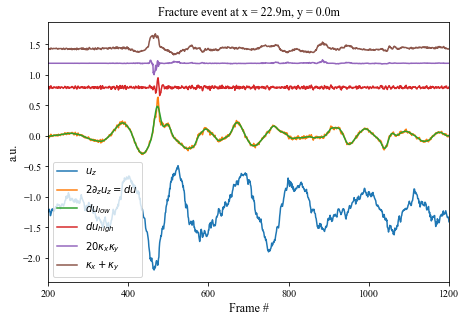

In [469]:


graphes.save_figs(figs,savedir=savefolder,overwrite=True)

In [470]:
dt = 600

res = {}
fc = 0.05
for key in ['Max','Min','indM','indm']:
    res[key]=np.zeros((ny,nx))
    
for i in range(ny):
    for j in range(nx):
    
        #ax.plot(Udx[2,i,j,:])
        y = Udx[2,i,j,:]
        y = kappa[i,j,:]
        [b,a] = sig.butter(4,fc,'low')
        y_low =  sig.filtfilt(b,a,y)
        frac = y - y_low
        indM = np.argmax(frac)
        indm = np.argmin(frac)
    
        res['Max'][i,j] = frac[indM]
        res['Min'][i,j] = frac[indm]
        res['indM'][i,j] = indM
        res['indm'][i,j] = indm
        
#shift = np.max(y)*1.5
#ax.plot(y_low)
#ax.plot(y-y_low+shift)
#ax.plot(data['u'][2,i,j,:])


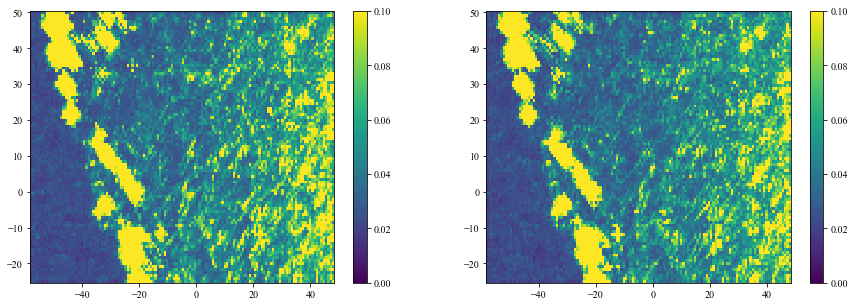

In [472]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[0].pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.1)
plt.colorbar(sc)

sc=  ax[1].pcolormesh(X,Y,np.abs(res['Min']),vmin=0,vmax=0.1)
plt.colorbar(sc)

In [289]:
np.mean(res['Max'])

0.05839521597410959

-0.05762318591267472

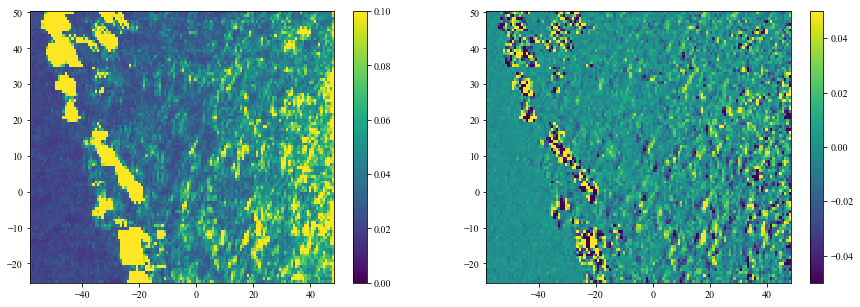

In [287]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[0].pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.01)
plt.colorbar(sc)

sc=  ax[1].pcolormesh(X,Y,res['Max']-np.abs(res['Min']),vmin=-0.05,vmax=0.05)
plt.colorbar(sc)

In [445]:
import skimage

peaks = skimage.feature.peak_local_max(res['Max'], min_distance=5)

In [294]:
peaks[:,0]

array([79, 12, 31, 87, 68, 57, 38, 42, 25, 46, 85, 87, 82, 71, 36, 16, 80,
       63, 72, 74, 49, 58, 19, 11, 13, 26, 44, 41, 16, 15, 54, 44, 26, 72,
       45, 81, 34, 41, 87, 85, 69, 45, 26, 63, 19,  7, 56, 32, 66, 76, 31,
       27, 72, 67, 85, 67, 81, 76, 57, 62, 77, 42,  9, 19, 41, 27,  7])

In [302]:
print(y.shape)

(93,)


array([[0.02597624, 0.02394403, 0.02019582, ..., 0.06201765, 0.06264736,
        0.11212441],
       [0.02281045, 0.0200001 , 0.01877559, ..., 0.04343589, 0.04811085,
        0.09644722],
       [0.02623224, 0.02286189, 0.02080425, ..., 0.06023905, 0.07153532,
        0.16201839],
       ...,
       [0.03165707, 0.02269198, 0.02510308, ..., 0.0434985 , 0.03723562,
        0.05264731],
       [0.03545667, 0.0224209 , 0.02334463, ..., 0.04323421, 0.0502362 ,
        0.09114173],
       [0.02930901, 0.0231673 , 0.02267534, ..., 0.038301  , 0.04273073,
        0.09581344]])

In [316]:
forme = ny/nx

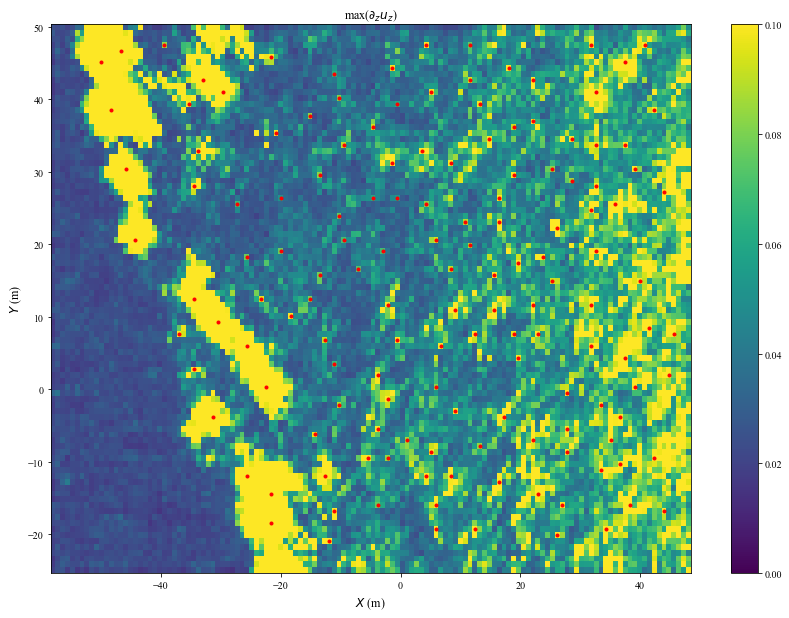

In [534]:
fig,ax = plt.subplots(figsize=(4.78*3,3*4.78*forme))#,ncols=2)

peaks = skimage.feature.skimage.feature.peak_local_max(image, min_distance=1,(res['Max'], min_distance=3)
sc=  ax.pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.1)
plt.colorbar(sc)

n,_ = peaks.shape

y = data['Y'][:,0]


res['positions']=[]
for i in range(n):
    iind = peaks[i,0]
    jind = peaks[i,1]
    if res['Max'][iind,jind]>0.05:
        ax.plot(x[jind],y[iind],'r.')
        tind = int(res['indM'][iind,jind])
        res['positions'].append([iind,jind,tind])
figs = graphes.legende('$X$ (m)','$Y$ (m)','max($\partial_z u_z$)')

graphes.save_figs(figs,savedir=savefolder,prefix='location_fractures_gauss_',overwrite=True)

In [452]:
len(res['positions'])/2

57.0

0.0015151515151515152


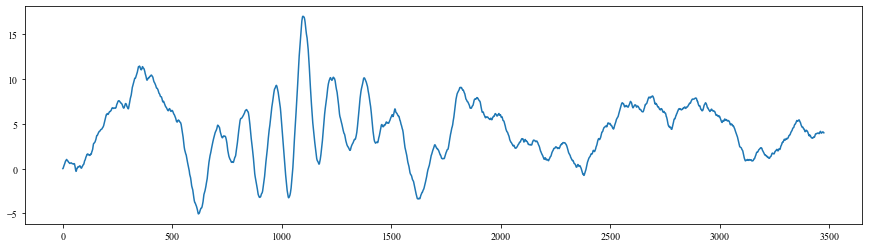

In [371]:
fig,ax = plt.subplots(figsize=(15,4))#,ncols=2)
ax.plot(h[40,40,:])

In [372]:
dxh,dyh = np.gradient(uz,axis=(0,1))

KeyboardInterrupt: 

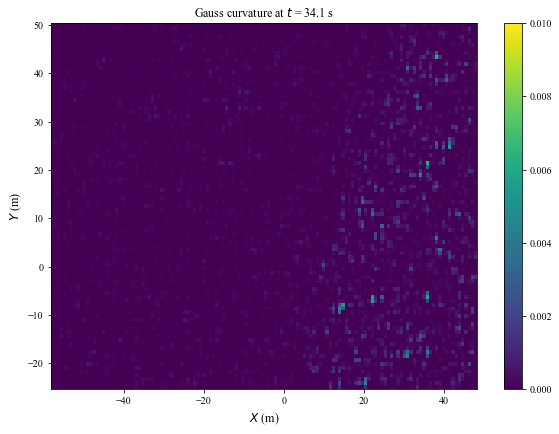

In [747]:
fig,ax = plt.subplots(figsize=(2*4.78,2*4.78*forme))#,ncols=2)
t = data['t']
i0 = 400
for i in range(i0,1200,1):
    t0 = np.round(t[i],decimals=1)
    sc = ax.pcolormesh(X,Y,gauss[:,:,i],vmin=0,vmax=0.01)
    if i==i0:
        plt.colorbar(sc)
    
    figs = graphes.legende('$X$ (m)','$Y$ (m)',f'Gauss curvature at $t$ = {t0} s')
    graphes.save_figs(figs,savedir=savefolder+f'/movie_gauss/',prefix=f'movie_{i}',frmt='png')

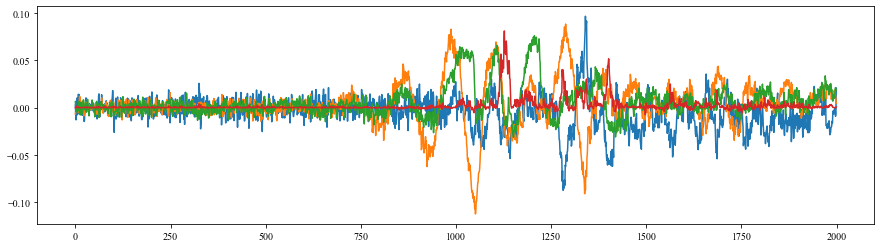

In [405]:
fig,ax = plt.subplots(figsize=(15,4))#,ncols=2)
ax.plot(kappa[20,40,:2000])
ax.plot(Udx[2,20,40,:2000])
ax.plot(divu[20,40,:2000])
ax.plot(gauss[20,40,:2000]*50)

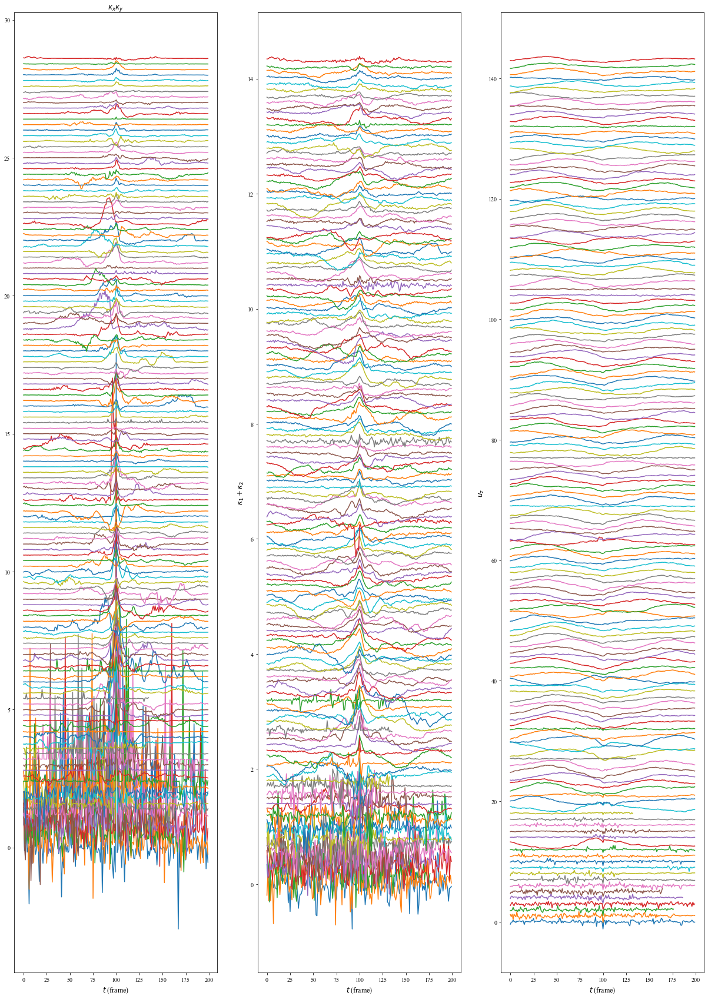

In [488]:
ncol = 3
fig,axs = plt.subplots(figsize=(7*ncol,30),ncols=ncol)

dt=100
b = 20

fc = 0.05
for k,pos in enumerate(res['positions'][:-2]):
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,fc,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low
    #print(tmax)
#    axs[0].plot(frac[tmax-dt:tmax+dt]+k*0.1)
#    graphes.legende('$t$ (frame)',r'$Cr$','',ax=axs[0])

    u = data['u'][2,i,j,tmax-dt:tmax+dt]
    axs[2].plot(u+k)
    graphes.legende('$t$ (frame)',r'$u_z$','',ax=axs[2])
    
    axs[1].plot(kappa[i,j,tmax-dt:tmax+dt]+k*0.1)
    graphes.legende('$t$ (frame)',r'$\kappa_1 + \kappa_2$','',ax=axs[1])

    axs[0].plot(gauss[i,j,tmax-dt:tmax+dt]*50+k*0.2)
    graphes.legende('$t$ (frame)','','$\kappa_x \kappa_y$',ax=axs[0])

    #print(kappa[i,j,tmax])

#    ax.plot(data['u'][2,i,j,tmax-dt:tmax+dt]+k)

In [505]:
len(res['positions'])

146

In [725]:
data['X'][i,:]

array([-58.        , -57.19083969, -56.38167939, -55.57251908,
       -54.76335878, -53.95419847, -53.14503817, -52.33587786,
       -51.52671756, -50.71755725, -49.90839695, -49.09923664,
       -48.29007634, -47.48091603, -46.67175573, -45.86259542,
       -45.05343511, -44.24427481, -43.4351145 , -42.6259542 ,
       -41.81679389, -41.00763359, -40.19847328, -39.38931298,
       -38.58015267, -37.77099237, -36.96183206, -36.15267176,
       -35.34351145, -34.53435115, -33.72519084, -32.91603053,
       -32.10687023, -31.29770992, -30.48854962, -29.67938931,
       -28.87022901, -28.0610687 , -27.2519084 , -26.44274809,
       -25.63358779, -24.82442748, -24.01526718, -23.20610687,
       -22.39694656, -21.58778626, -20.77862595, -19.96946565,
       -19.16030534, -18.35114504, -17.54198473, -16.73282443,
       -15.92366412, -15.11450382, -14.30534351, -13.49618321,
       -12.6870229 , -11.8778626 , -11.06870229, -10.25954198,
        -9.45038168,  -8.64122137,  -7.83206107,  -7.02

In [572]:
dt

0.03336670003336906

In [625]:
instants = [20,21,25,28,29,30,31,33,35,37,39,40,41,42,43,45,46,47,48,49,53,54,55,56,57,58,59,60,64,66,67,68,70,75,76,78,79,81,82,83,84,85,86,88,89,90,91,92,96,99,102,106,108,110,112,115,117,118,124,133]

In [804]:
def display_exemple(i,j,tmin,tmax,ax=None,ind=None):
    if ax==None:
        fig,ax = plt.subplots(figsize=(4.78*1.5,4.78))

    ax.plot(data['u'][2,i,j,:]-1.2)
#    ax.plot(Udx[2,i,j,:])
    
    
    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,0.1,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low
    y_high = y-y_low

    shift = np.max(y)*2.5
    shift2 = shift*1.5
    ax.plot(y_high*2+shift)

    fs = 0.1/33
    y=data['u'][2,i,j,:]
    [b,a] = sig.butter(4,fs,'high')
    y_high =  sig.filtfilt(b,a,y)
    h = np.cumsum(y_high)*dt


#    ax.plot(frac*10+shift)
    #ax.plot(y_low)
    #ax.plot(gauss[i,j,:]*50+shift2)
    ax.plot(kappa[i,j,:]*5)#+shift2*1.2)

    
    ax.plot(np.diff(kappa[i,j,:])*100)#+shift2*1.2)

    #dtkap = np.diff(kappa[i,j,:])
    #fs = 0.05
    #y=data['u'][2,i,j,:]
    #[b,a] = sig.butter(4,fs,'low')
    #dkt_low =  sig.filtfilt(b,a,dtkap)
    #ax.plot(dkt_low*100)#+shift2*1.2)


    criterion = kappa[i,j,:]
    peaks = sig.find_peaks(criterion,distance=30,prominence=0.001)[0]
    ax.plot(peaks,criterion[peaks]*5,'rx')

    t0 = tmin+(tmax-tmin)/2


    peaks = sig.find_peaks(h,distance=30,prominence=0.01)[0]
    fact = 5
    ax.plot(h*fact)

    ax.plot([t0,t0],[-2,2],'k--',alpha=0.3)

    ax.plot(peaks,fact*h[peaks],'rx')

    #closest max before & after
    indMb = np.argmin(np.abs(peaks[peaks<=t0]-t0))
    indMa = np.argmin(np.abs(peaks[peaks>t0]-t0))
    tMb = peaks[peaks<=t0][indMb]
    tMa = peaks[peaks>t0][indMa]

    AMb = h[peaks[indMb]]
    AMa = h[peaks[indMa]]
    Dt = tMa-tMb
    print((t0-tMb)/Dt)
    
    peaks = sig.find_peaks(-h,distance=30,prominence=0.01)[0]
    indmb = np.argmin(np.abs(peaks[peaks<=t0]-t0))
    indma = np.argmin(np.abs(peaks[peaks>t0]-t0))
    tmb = peaks[peaks<=t0][indmb]
    tma = peaks[peaks>t0][indma]

    Amb = h[peaks[indmb]]
    Ama = h[peaks[indma]]
    Dtm = tma-tmb
    phim = (t0-tmb)/Dtm
    
    #if phim>=0.5:
    #    phim = phim-0.5
    #else:
    #    phim = phim+0.5
    print(phim)
    
    ax.plot(peaks,fact*h[peaks],'r+')

            
    plt.legend(['$u_z$','$du_{high}$',r'$20 \kappa_x + \kappa_y$',r'$partial_t \kappa$','$h$'],fontsize=10,loc=1)
    
    #ax.plot(data['u'][2,i,j,:])
    ax.set_xlim([tmin,tmax])
    
    x0 = np.round(data['X'][0,j],decimals=1)
    y0 = np.round(data['Y'][i,0],decimals=1)
    figs = graphes.legende('Frame #','a.u.',f'Fracture event {ind} at x = {x0}m, y = {y0}m',ax=ax)

    res = {}

    res['phiM'] = (t0-tMb)/Dt
    res['phim'] = phim #(t0-tmb)/Dt
    res['hc'] = h[int(t0)]
    res['AMac'] = AMb
    res['AMbc'] = AMa
    res['Amac'] = Amb
    res['Ambc'] = Ama

    res['kappac'] = kappa_abs[i,j,int(t0)]    

    res['x']=data['X'][0,j]
    res['y']=data['Y'][i,0]

    return figs,ax,res

In [703]:
pos

[11, 67, 710]

0.11029411764705882
0.6416666666666667


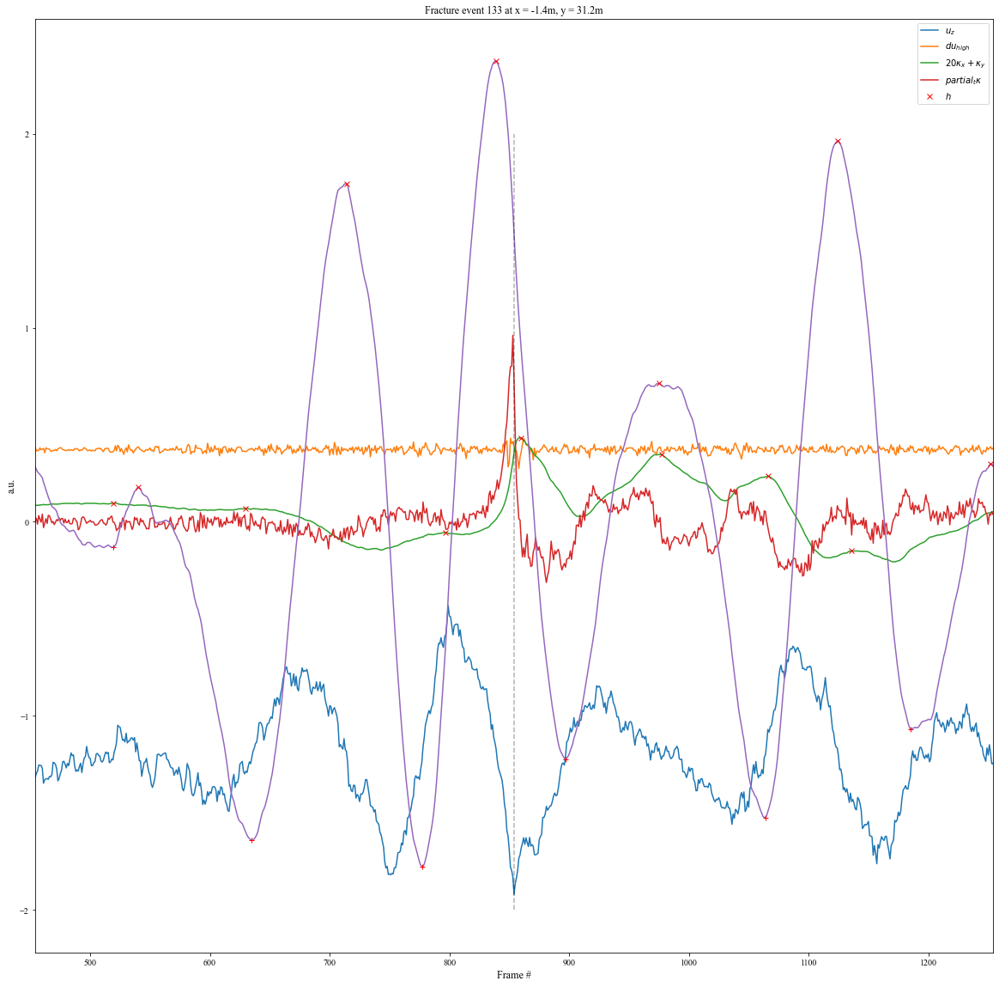

In [805]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[9]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.1746031746031746
0.6434108527131783


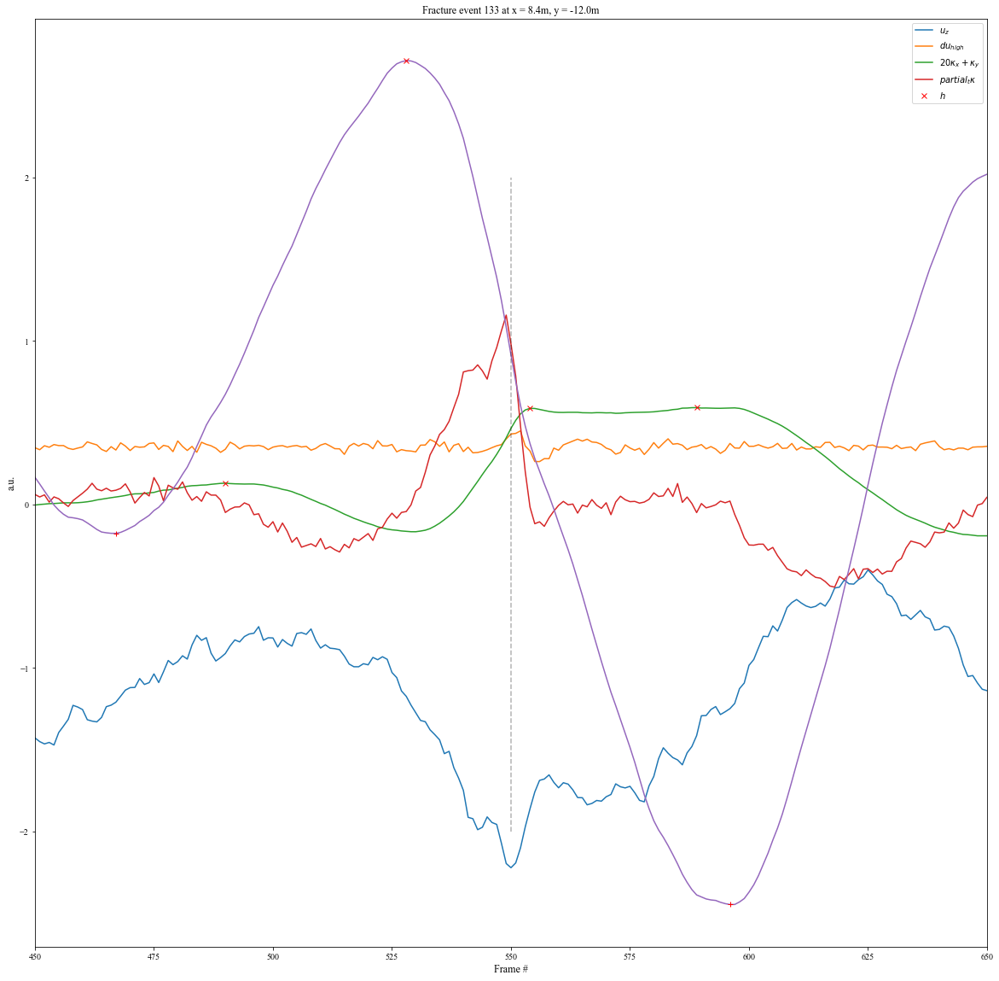

In [807]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[12]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 100
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.14965986394557823
0.6692913385826772


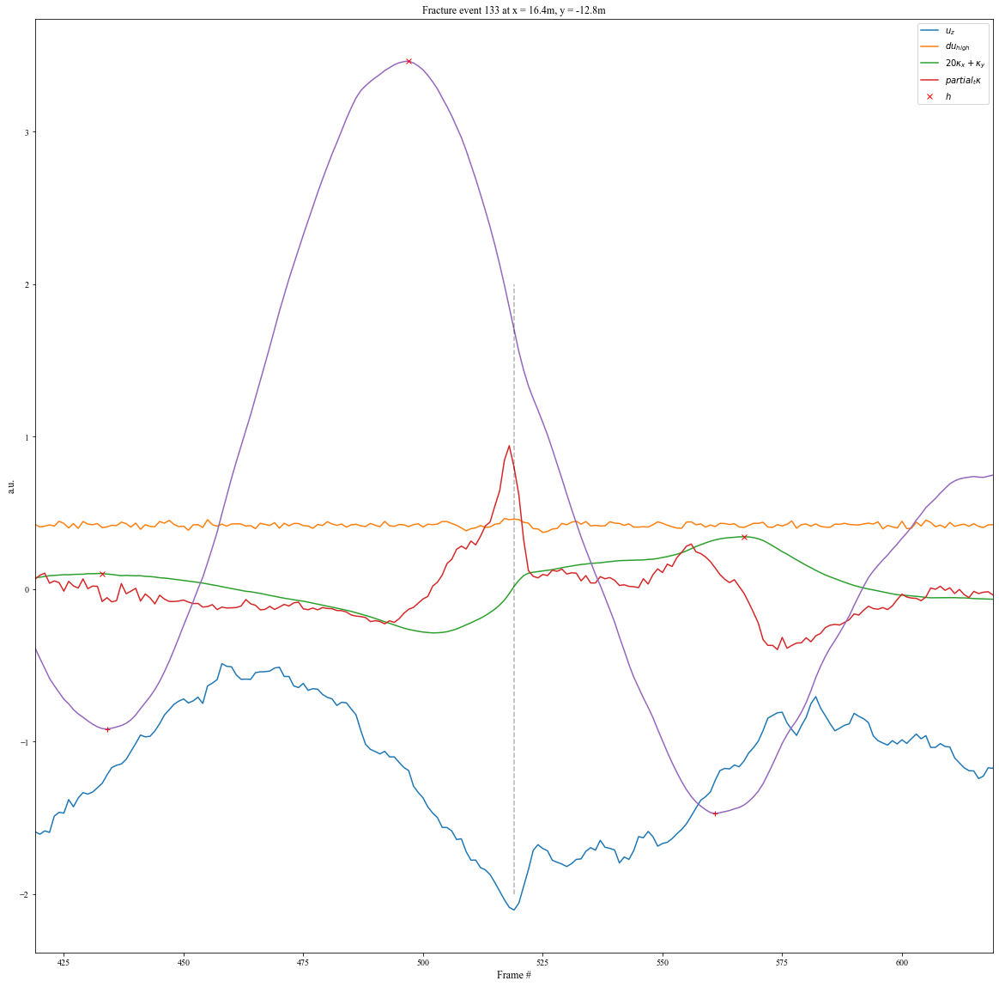

In [808]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[15]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 100
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.39655172413793105
0.8888888888888888


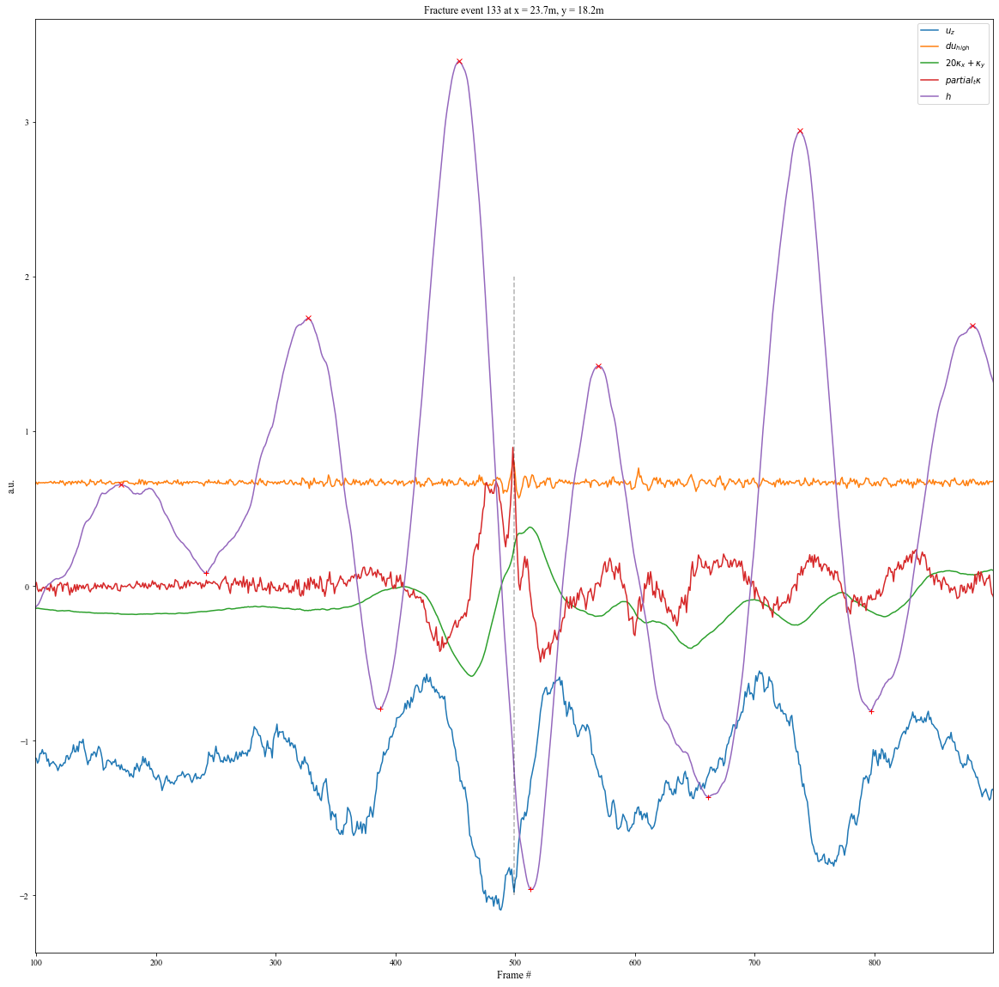

In [787]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[22]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.14906832298136646
0.6119402985074627


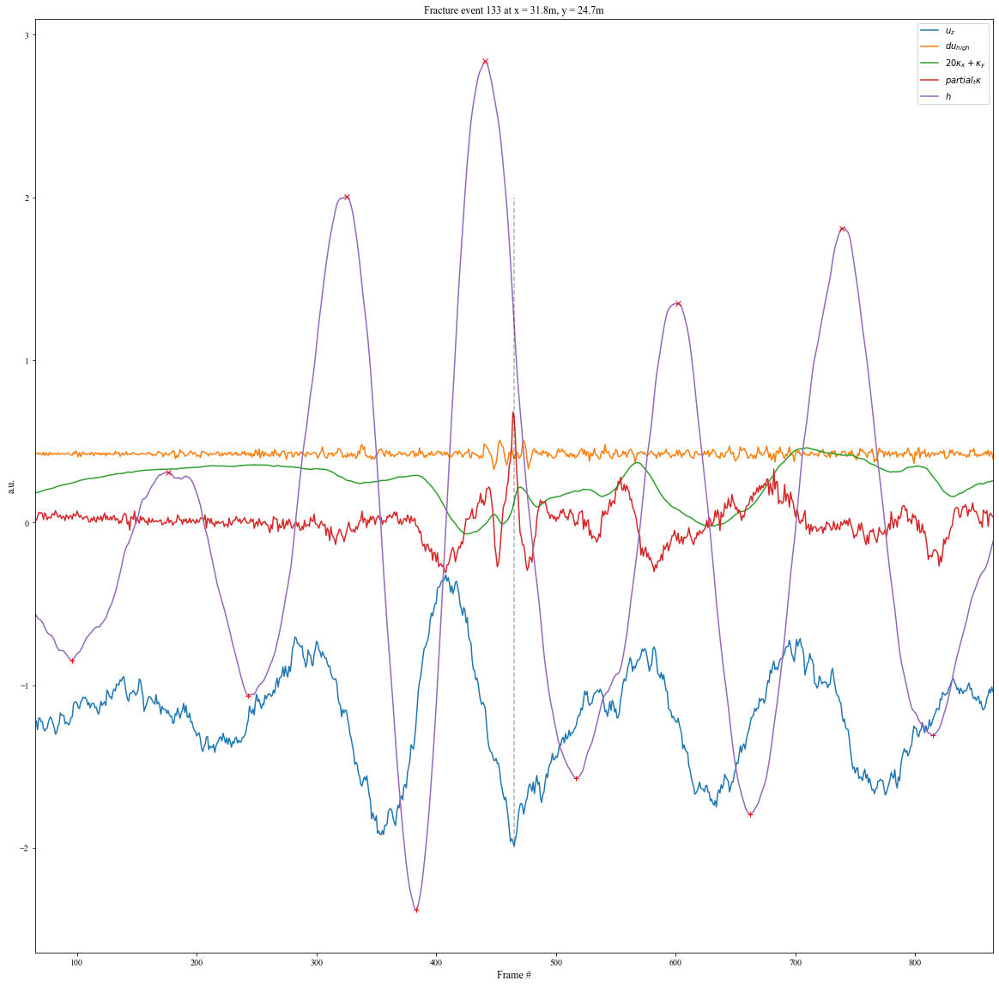

In [789]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[17]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

In [557]:
len(res['positions'])

146

0.2857142857142857
0.7611940298507462
0.032
0.514792899408284
0.2064516129032258
0.768
0.10256410256410256
0.6115702479338843
0.5882352941176471
0.05333333333333334
0.0603448275862069
0.5923076923076923
0.16149068322981366
0.6518518518518519
0.15483870967741936
0.6984126984126984
0.15723270440251572
0.6259541984732825
0.11029411764705882
0.6416666666666667
0.12080536912751678
0.6909090909090909
0.7
0.16666666666666666
0.1746031746031746
0.6434108527131783
0.25874125874125875
0.8012820512820513
0.22972972972972974
0.7916666666666666
0.14965986394557823
0.6692913385826772
0.07627118644067797
0.5966386554621849
0.14906832298136646
0.6119402985074627
0.16352201257861634
0.5562913907284768
0.12352941176470589
0.5033557046979866
0.38333333333333336
0.859375
0.4166666666666667
0.937007874015748
0.39655172413793105
0.8888888888888888
0.19375
0.72
0.1864406779661017
0.6515151515151515
0.25833333333333336
0.75
0.18110236220472442
0.7094017094017094
0.2392638036809816
0.853448275862069
0.13924050

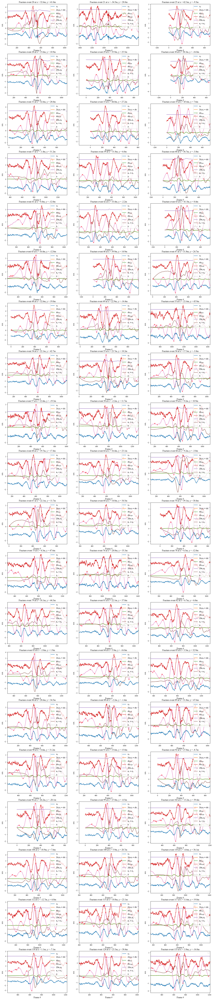

In [752]:
fig,axs = plt.subplots(figsize=(20,100),ncols=3,nrows=20)
axs  = np.reshape(axs,(3*20,))

results=[]
for ind,(ax,inst) in enumerate(zip(axs,instants)):
    k = inst
    #print(inst)
    
    pos = res['positions'][k]
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    figs,ax,result = display_exemple(i,j,tmax-500,tmax+500,ax=axs[ind],ind=k)
    results.append(result)

In [733]:
results[0].keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

In [749]:
results[0].keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

(0.0, 1.0)

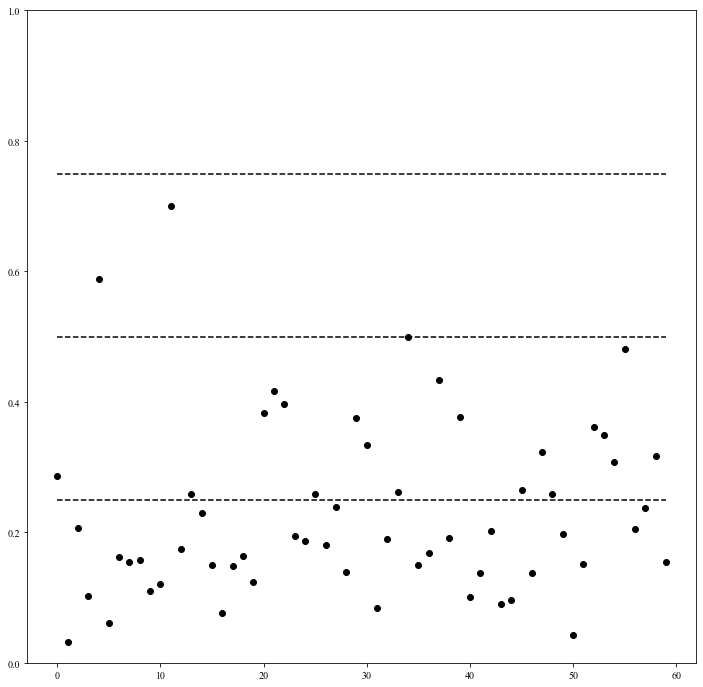

In [753]:
fig,ax = plt.subplots(figsize=(12,12))#,ncols=3,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    #dphi = #np.abs((result['phiM']-result['phim']))
    ax.plot(i,phase,'ko')#,yerr=dphi,marker='o')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
ax.plot(samples,0.5*np.ones(60),'k--')
ax.plot(samples,0.25*np.ones(60),'k--')
ax.plot(samples,0.75*np.ones(60),'k--')

ax.set_ylim([0,1])

(0.0, 1.0)

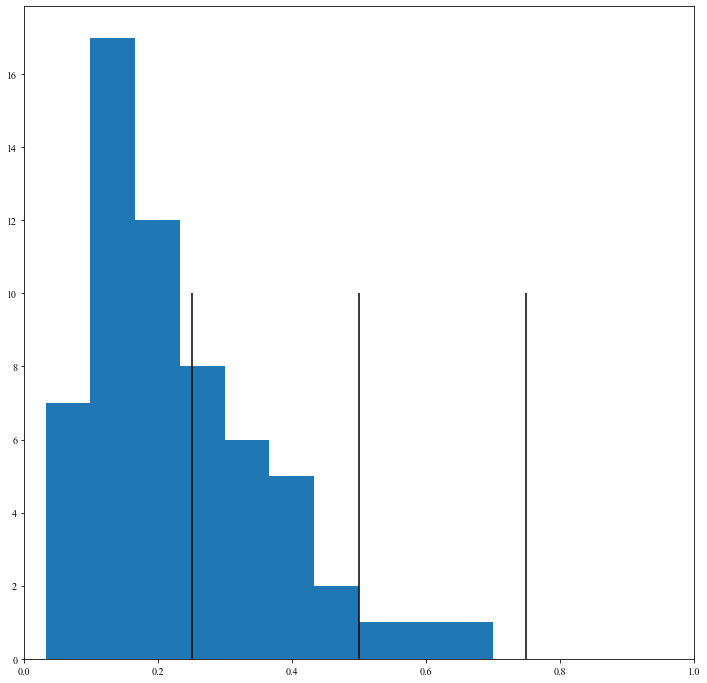

In [754]:
fig,ax = plt.subplots(figsize=(12,12))#,ncols=3,nrows=20)
plt.hist(phases,10)

ax.vlines(0.5,0,10,color='k')
ax.vlines(0.25,0,10,'k')
ax.vlines(0.75,0,10,'k')

ax.set_xlim([0,1])

In [711]:
result.keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

(0.0, 0.75)

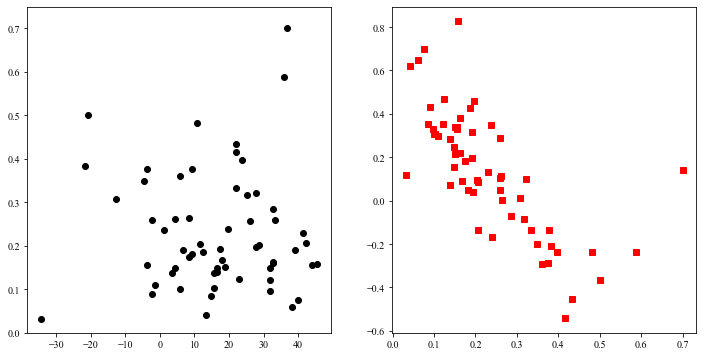

In [756]:
fig,axs = plt.subplots(figsize=(12,6),ncols=2)#,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    x = result['x']#+result['phim'])/2
    y = result['y']#+result['phim'])/2

    hc = result['hc']#+result['phim'])/2
    #print(y)
    #dphi = #np.abs((result['phiM']-result['phim']))
    axs[0].plot(x,phase,'ko')#,yerr=dphi,marker='o')
    #axs[0].plot(y,phase+1,'rs')#,yerr=dphi,marker='o')

    axs[1].plot(phase,hc,'rs')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
#ax.plot(samples,0.5*np.ones(60),'k--')
#ax.plot(samples,0.25*np.ones(60),'k--')
#ax.plot(samples,0.75*np.ones(60),'k--')

axs[0].set_ylim([0,0.75])

(0.0, 0.75)

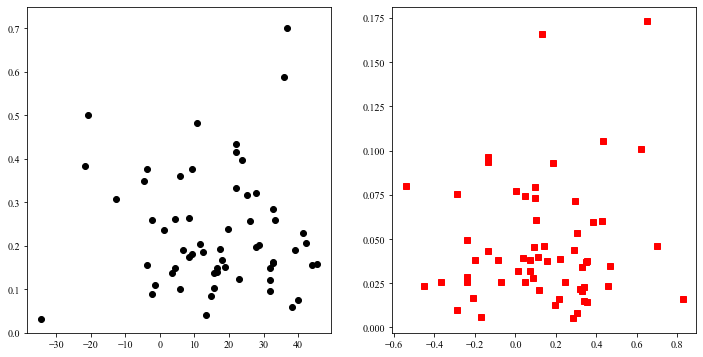

In [759]:
fig,axs = plt.subplots(figsize=(12,6),ncols=2)#,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    x = result['x']#+result['phim'])/2
    y = result['y']#+result['phim'])/2

    hc = result['hc']#+result['phim'])/2
    kappac = result['kappac']#+result['phim'])/2
    #print(y)
    #dphi = #np.abs((result['phiM']-result['phim']))
    axs[0].plot(x,phase,'ko')#,yerr=dphi,marker='o')
    #axs[0].plot(y,phase+1,'rs')#,yerr=dphi,marker='o')

    axs[1].plot(hc,kappac,'rs')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
#ax.plot(samples,0.5*np.ones(60),'k--')
#ax.plot(samples,0.25*np.ones(60),'k--')
#ax.plot(samples,0.75*np.ones(60),'k--')

axs[0].set_ylim([0,0.75])

In [698]:
bool = np.abs(phases-0.1)<0.1
indices = np.where(bool)[0]
print(indices)
print(len(indices))


[ 1  3  5  6  7  8  9 10 12 15 16 17 18 19 23 24 26 28 31 32 35 36 38 40
 41 43 44 46 49 50 51 59]
32


In [699]:
results = len(np.asarray(results)[bool])

In [700]:
print(len(indices))

32


(0.0, 1.0)

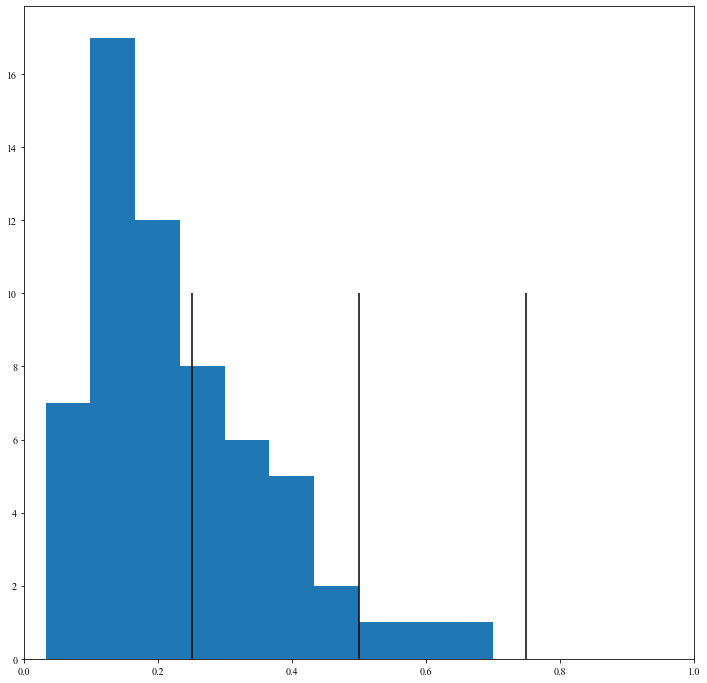

0.032
0.514792899408284
0.10256410256410256
0.6115702479338843
0.0603448275862069
0.5923076923076923
0.16149068322981366
0.6518518518518519
0.15483870967741936
0.6984126984126984
0.15723270440251572
0.6259541984732825
0.11029411764705882
0.6416666666666667
0.12080536912751678
0.6909090909090909
0.1746031746031746
0.6434108527131783
0.14965986394557823
0.6692913385826772
0.07627118644067797
0.5966386554621849
0.14906832298136646
0.6119402985074627
0.16352201257861634
0.5562913907284768
0.12352941176470589
0.5033557046979866
0.19375
0.72
0.1864406779661017
0.6515151515151515
0.18110236220472442
0.7094017094017094
0.13924050632911392
0.7090909090909091
0.08450704225352113
0.6341463414634146
0.19047619047619047
0.7209302325581395
0.14925373134328357
0.6183206106870229
0.1678832116788321
0.7083333333333334
0.19135802469135801
0.7251908396946565
0.10077519379844961
0.6090225563909775
0.1377245508982036
0.640625
0.09016393442622951
0.616
0.0963855421686747
0.5864661654135338
0.138157894736842

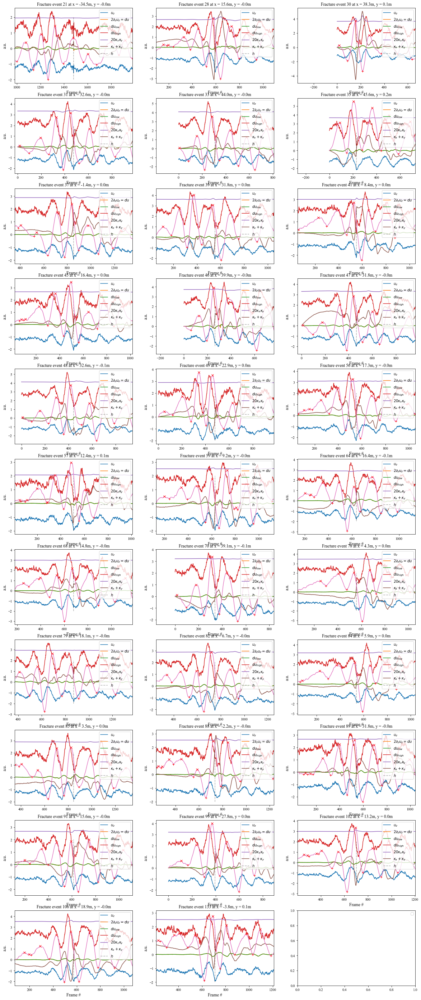

In [702]:
fig,axs = plt.subplots(figsize=(20,50),ncols=3,nrows=11)
axs  = np.reshape(axs,(3*11,))

results=[]
for ind,(ax,indice) in enumerate(zip(axs,indices)):
    #print(indices)
    k = instants[indice]
    #print(inst)
    
    pos = res['positions'][k]
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    figs,ax,result = display_exemple(i,j,tmax-500,tmax+500,ax=axs[ind],ind=k)
    results.append(result)

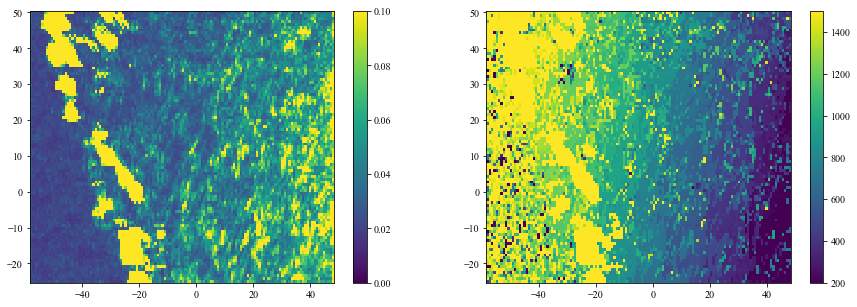

In [284]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[1].pcolormesh(X,Y,res['indM'],vmin=200,vmax=1500)
plt.colorbar(sc)
sc=  ax[0].pcolormesh(X,Y,np.abs(res['Max']),vmin=0,vmax=0.1)
plt.colorbar(sc)

In [209]:
coords = np.asarray(coords).astype(int)
print(coords)

[[   0   43 1326]
 [   0   44 1370]
 [   0   43 1483]
 ...
 [  91  118 1177]
 [  91  121 1165]
 [  91  130  228]]


NameError: name 'toto' is not defined

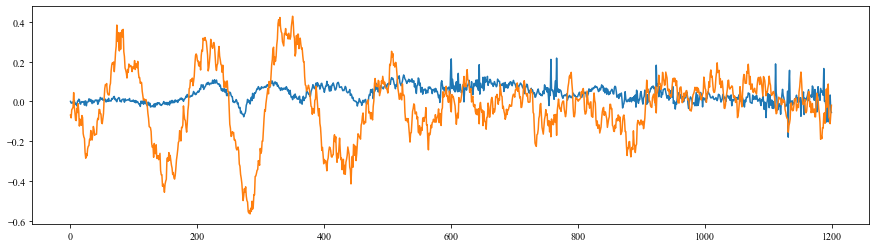

In [211]:
fig,ax = plt.subplots(figsize=(15,4))

dt = 600
for c in coords:
    i = c[0]
    j = c[1]
    tmax = int(c[2])
    ax.plot(divu[i,j,tmax-dt:tmax+dt])
    ax.plot(data['u'][2,i,j,tmax-dt:tmax+dt])
    toto

In [169]:
X[i,j,]

ValueError: 3 indexing arguments for 2 dimensions

(93, 132, 3475)
(3475,)
(3475,)
106


(200.0, 1500.0)

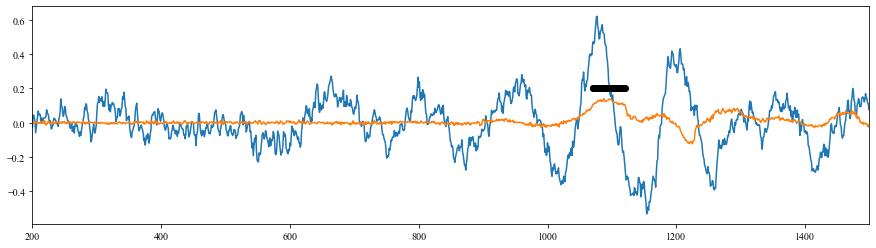

In [184]:
fig,ax = plt.subplots(figsize=(15,4))

i = 40
j = 36
print(divu.shape)
print(t.shape)
z = divu[i][j]
print(z.shape)

tind = np.arange(len(t))
b=4
ax.plot(data['u'][2,i,j,:])
ax.plot(divu[i,j,:])
#ax.plot(Udx[0,i,j,:]*b)
#ax.plot(Udy[1,i,j,:]*b)

nf = np.sum(fractures[i,j,:])
print(nf)
ax.plot(tind[fractures[i,j,:]],0.2*np.ones(nf),'ko')
ax.set_xlim([200,1500])

{1: {'fignum': 'Y_m_vs_X_m', 'data': {}}}

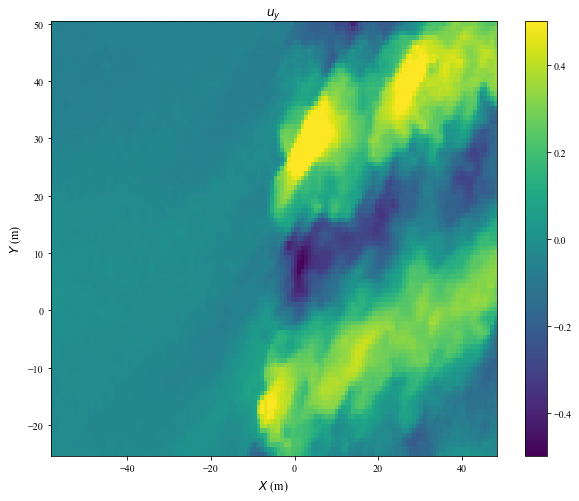

In [46]:
fig,ax = plt.subplots(figsize=(10,8))

X = data['X']
Y = data['Y']
i=800
sc = ax.pcolormesh(X,Y,data['u'][1,:,:,i],vmin=-0.5,vmax=0.5)
plt.colorbar(sc)

graphes.legende('$X$ (m)','$Y$ (m)','$u_y$')